In [120]:
import pandas as pd
import matplotlib.pyplot as plt


In [5]:
df_song_data = pd.read_csv('data_49969.csv')

df_song_data.shape
df_song_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49970 entries, 0 to 49969
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   49970 non-null  int64  
 1   title                49970 non-null  object 
 2   tag                  49970 non-null  object 
 3   artist               49970 non-null  object 
 4   year                 49970 non-null  int64  
 5   views                49970 non-null  int64  
 6   decade               49970 non-null  object 
 7   lyrcis_preprocessed  49968 non-null  object 
 8   sentiment            49970 non-null  object 
 9   compound             49970 non-null  float64
 10  sentiment_category   49970 non-null  object 
 11  emotion              49970 non-null  object 
 12  cluster              49970 non-null  int64  
 13  emotion_Happy        49970 non-null  float64
 14  emotion_Angry        49970 non-null  float64
 15  emotion_Surprise     49970 non-null 

In [6]:
df_cluster_id = df_song_data[['id','cluster','compound','emotion_Happy', 'emotion_Angry','emotion_Surprise','emotion_Sad', 'emotion_Fear']]
df_cluster_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49970 entries, 0 to 49969
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                49970 non-null  int64  
 1   cluster           49970 non-null  int64  
 2   compound          49970 non-null  float64
 3   emotion_Happy     49970 non-null  float64
 4   emotion_Angry     49970 non-null  float64
 5   emotion_Surprise  49970 non-null  float64
 6   emotion_Sad       49970 non-null  float64
 7   emotion_Fear      49970 non-null  float64
dtypes: float64(6), int64(2)
memory usage: 3.1 MB


In [18]:
df_cluster = df_song_data[['cluster','compound','emotion_Happy', 'emotion_Angry','emotion_Surprise','emotion_Sad', 'emotion_Fear']]

## Dane wewnątrz klastrów

In [23]:
def cluster_stats_desc(cluster_id):
    selected_cluster_data = df_cluster[df_cluster['cluster'] == cluster_id][['compound','emotion_Happy', 'emotion_Angry','emotion_Surprise','emotion_Sad', 'emotion_Fear']]
    # selected_cluster_data = df_cluster[df_cluster['cluster'] == 1]['emotion_Sad']

    cluster_stats = selected_cluster_data.describe()
    print(f"Statystyki opisowe w klastrze {cluster_id}:")
    print(cluster_stats)


## Statystyka opisowa dla klastrów

**Count** (Liczba): Ilość niepustych wartości w kolumnie.

**Mean** (Średnia): Średnia arytmetyczna wszystkich wartości w kolumnie.

**Std** (Odchylenie standardowe): Miara rozproszenia danych, która określa, jak bardzo wartości różnią się od średniej arytmetycznej.

**Min** (Minimum): Najmniejsza wartość w kolumnie.

**25%** (Kwartyl dolny): Wartość, poniżej której znajduje się 25% danych (1. kwartyl).

**50%** (Mediana): Wartość dzieląca dane na dwie równe części, czyli 50% danych jest poniżej i 50% powyżej tej wartości.

**75%** (Kwartyl górny): Wartość, poniżej której znajduje się 75% danych (3. kwartyl).

**Max** (Maksimum): Największa wartość w kolumnie.

In [46]:
import pandas as pd

def check_stats(df, column):
    cluster_stats_list = []

    for cluster_number in range(1000):
        cluster_data = df[df['cluster'] == cluster_number]
        stats = cluster_data[[column]].describe().transpose()
        cluster_stats_list.append(stats)

    result_df = pd.concat(cluster_stats_list, ignore_index=True)
    return result_df


In [47]:
df_stats_sad = check_stats(df_cluster, 'emotion_Sad')
df_stats_sad

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.077297,0.044637,0.00,0.0600,0.080,0.11,0.17
1,31.0,0.113226,0.048743,0.00,0.0750,0.120,0.15,0.19
2,80.0,0.212375,0.031432,0.15,0.1875,0.210,0.24,0.28
3,32.0,0.604375,0.036184,0.52,0.5800,0.610,0.62,0.70
4,101.0,0.300792,0.027265,0.24,0.2800,0.300,0.32,0.36
...,...,...,...,...,...,...,...,...
995,62.0,0.164355,0.027017,0.12,0.1500,0.170,0.18,0.25
996,24.0,0.251250,0.027868,0.18,0.2300,0.250,0.27,0.29
997,37.0,0.082703,0.037465,0.00,0.0600,0.090,0.12,0.13
998,30.0,0.142000,0.030445,0.07,0.1300,0.145,0.15,0.21


In [48]:
df_stats_fear = check_stats(df_cluster, 'emotion_Fear')
df_stats_fear

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.021351,0.031373,0.00,0.0000,0.000,0.0500,0.11
1,31.0,0.261613,0.046554,0.18,0.2350,0.260,0.2900,0.38
2,80.0,0.304000,0.026653,0.24,0.2875,0.300,0.3300,0.37
3,32.0,0.153438,0.040926,0.08,0.1200,0.155,0.1725,0.27
4,101.0,0.215248,0.028691,0.15,0.1900,0.220,0.2400,0.27
...,...,...,...,...,...,...,...,...
995,62.0,0.447419,0.034305,0.39,0.4200,0.440,0.4700,0.53
996,24.0,0.039167,0.032560,0.00,0.0000,0.045,0.0625,0.10
997,37.0,0.438108,0.042612,0.36,0.4000,0.440,0.4700,0.51
998,30.0,0.214667,0.053610,0.12,0.1825,0.220,0.2500,0.31


In [49]:
df_stats_happy = check_stats(df_cluster, 'emotion_Happy')
df_stats_happy

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.687297,0.040665,0.62,0.670,0.68,0.7200,0.77
1,31.0,0.089677,0.040123,0.00,0.065,0.08,0.1200,0.16
2,80.0,0.237500,0.027444,0.17,0.220,0.24,0.2500,0.29
3,32.0,0.019375,0.027467,0.00,0.000,0.00,0.0400,0.08
4,101.0,0.157030,0.025161,0.10,0.140,0.16,0.1700,0.22
...,...,...,...,...,...,...,...,...
995,62.0,0.047258,0.032043,0.00,0.030,0.05,0.0700,0.11
996,24.0,0.098333,0.036435,0.06,0.070,0.09,0.1200,0.18
997,37.0,0.091622,0.040928,0.00,0.060,0.09,0.1200,0.20
998,30.0,0.187667,0.039886,0.12,0.160,0.19,0.2075,0.27


In [50]:
df_stats_surprise = check_stats(df_cluster, 'emotion_Surprise')
df_stats_surprise

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.126757,0.033504,0.07,0.1100,0.120,0.1500,0.22
1,31.0,0.444839,0.041623,0.36,0.4200,0.440,0.4750,0.53
2,80.0,0.081250,0.026832,0.00,0.0600,0.080,0.1000,0.12
3,32.0,0.121250,0.036786,0.05,0.1000,0.125,0.1500,0.17
4,101.0,0.261881,0.023610,0.21,0.2400,0.260,0.2800,0.31
...,...,...,...,...,...,...,...,...
995,62.0,0.195161,0.020625,0.16,0.1800,0.190,0.2100,0.24
996,24.0,0.550000,0.025876,0.50,0.5300,0.550,0.5600,0.61
997,37.0,0.210270,0.033623,0.13,0.1900,0.210,0.2200,0.28
998,30.0,0.150000,0.034241,0.07,0.1325,0.150,0.1775,0.22


In [51]:
df_stats_angry = check_stats(df_cluster, 'emotion_Angry')
df_stats_angry

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.088108,0.024926,0.05,0.0700,0.08,0.100,0.16
1,31.0,0.090323,0.029943,0.04,0.0700,0.08,0.115,0.14
2,80.0,0.167625,0.017735,0.13,0.1575,0.17,0.180,0.21
3,32.0,0.102188,0.024195,0.07,0.0800,0.10,0.120,0.17
4,101.0,0.065446,0.017060,0.02,0.0600,0.07,0.080,0.10
...,...,...,...,...,...,...,...,...
995,62.0,0.145323,0.020543,0.11,0.1225,0.15,0.160,0.18
996,24.0,0.062917,0.018053,0.03,0.0575,0.06,0.070,0.10
997,37.0,0.177568,0.023143,0.14,0.1700,0.17,0.190,0.22
998,30.0,0.304000,0.026471,0.25,0.2900,0.30,0.320,0.38


In [52]:
df_stats_compound = check_stats(df_cluster, 'compound')
df_stats_compound

,count,mean,std,min,25%,50%,75%,max
0,37.0,0.931565,0.186043,-0.0191,0.967400,0.99140,0.997800,0.9991
1,31.0,0.121545,0.215652,-0.2960,-0.010600,0.05160,0.295700,0.5423
2,80.0,0.911121,0.133904,0.3818,0.905775,0.97175,0.985900,0.9982
3,32.0,-0.158200,0.217232,-0.5267,-0.310925,-0.19855,-0.045150,0.3182
4,101.0,-0.893140,0.153067,-0.9997,-0.992100,-0.96360,-0.859100,-0.3457
...,...,...,...,...,...,...,...,...
995,62.0,0.902540,0.111135,0.4724,0.882350,0.93445,0.979025,0.9988
996,24.0,0.920550,0.083904,0.6597,0.900450,0.93355,0.980650,0.9976
997,37.0,-0.932614,0.096390,-0.9998,-0.985600,-0.97300,-0.921000,-0.5106
998,30.0,-0.770040,0.201404,-0.9984,-0.927425,-0.86425,-0.601125,-0.2732


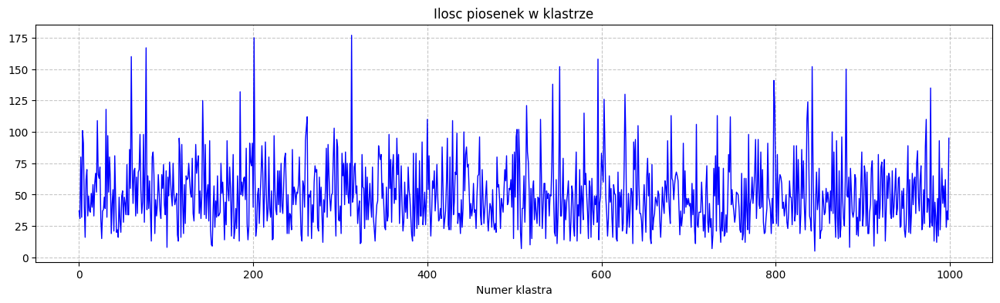

In [124]:
plt.figure(figsize=(16, 4))
plt.plot([i for i in range(0,1000)], df_stats_compound['count'], linestyle='-', color='b', linewidth=1)
plt.title('Ilosc piosenek w klastrze')
plt.xlabel('Numer klastra')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

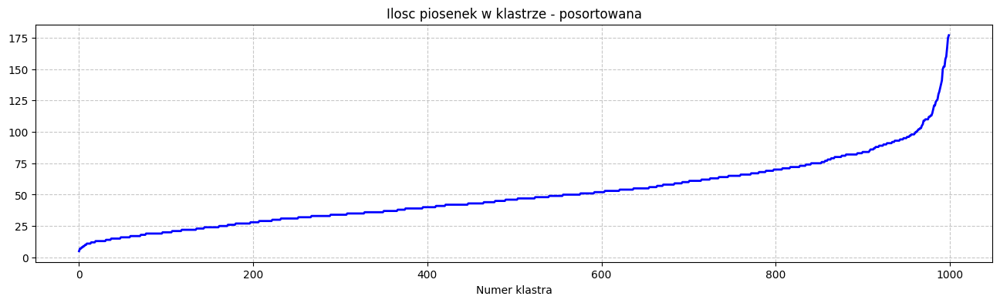

In [140]:
plt.figure(figsize=(16, 4))
plt.plot([i for i in range(0,1000)], df_stats_compound.sort_values(by=['count'])['count'], linestyle='-', color='b', linewidth=2)
plt.title('Ilosc piosenek w klastrze - posortowana')
plt.xlabel('Numer klastra')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [126]:
def plot_stat(df_to_plot, column, color):
    
    stat_desc = {
    'mean': 'Średnia (mean)',
    'std': 'Odchylenie standardowe (std)',
    'min': 'Minimalna wartość (min)',
    '25%': 'Kwartyl dolny (25%)',
    '50%': 'Mediana (50%)',
    '75%': 'Kwartyl górny (75%)',
    'max': 'Maksymalna wartość (max)',
    }
    
    stat_list = ['mean','std','min','25%','50%','75%','max']
    
    for stat in stat_list:
        stat_desc_pref = stat_desc[stat]
        description = f"{stat_desc_pref} dla kolumny \'{column}\' w poszczególnych klastrach"

        plt.figure(figsize=(16, 4))
        plt.plot([i for i in range(0,1000)], df_to_plot[stat], linestyle='-', linewidth=1, color=color)
        plt.title(description)
        plt.ylabel(stat)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()

In [133]:
def plot_stat_sorted(df_to_plot, column, color):
    
    stat_desc = {
    'mean': 'Średnia (mean)',
    'std': 'Odchylenie standardowe (std)',
    'min': 'Minimalna wartość (min)',
    '25%': 'Kwartyl dolny (25%)',
    '50%': 'Mediana (50%)',
    '75%': 'Kwartyl górny (75%)',
    'max': 'Maksymalna wartość (max)',
    }
    
    stat_list = ['mean','std','min','25%','50%','75%','max']
    
    for stat in stat_list:
        stat_desc_pref = stat_desc[stat]
        description = f"{stat_desc_pref} dla kolumny \'{column}\' w poszczególnych klastrach - posortowane"
        df_to_plot_sorted = df_to_plot.sort_values(by=[stat])

        plt.figure(figsize=(16, 4))
        plt.plot([i for i in range(0,1000)], df_to_plot_sorted[stat], linestyle='-', color=color, linewidth=2)
        plt.title(description)
        plt.ylabel(stat)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()

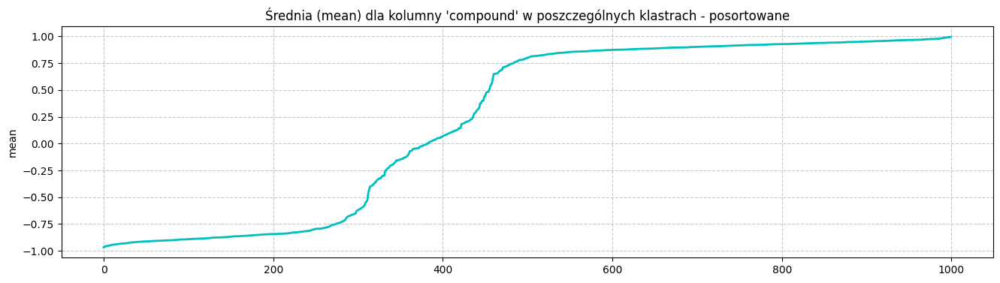

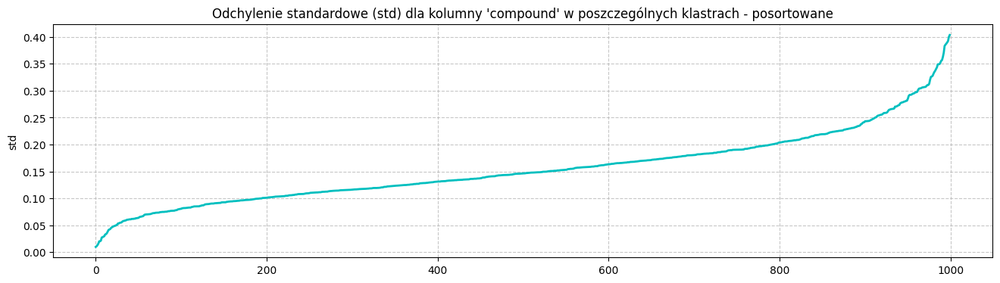

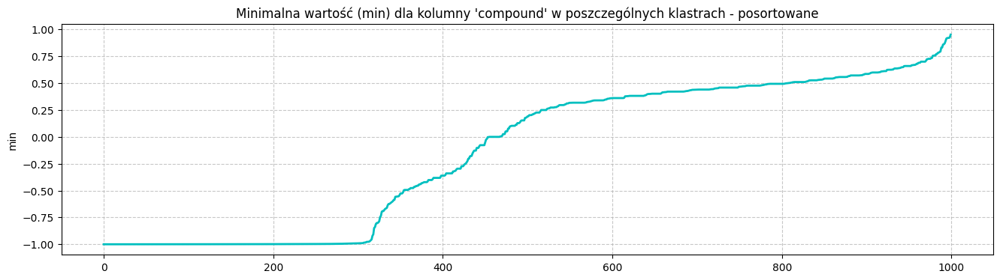

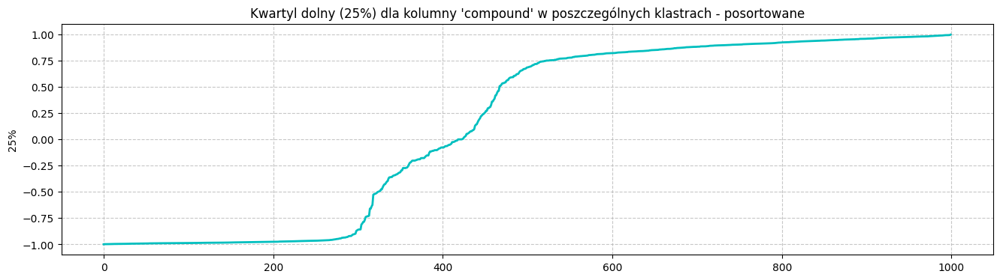

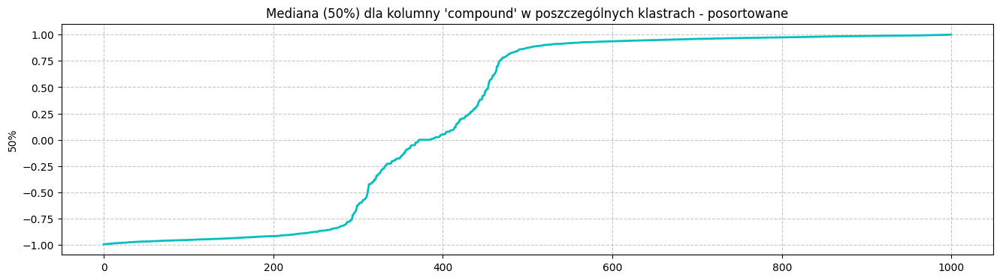

...

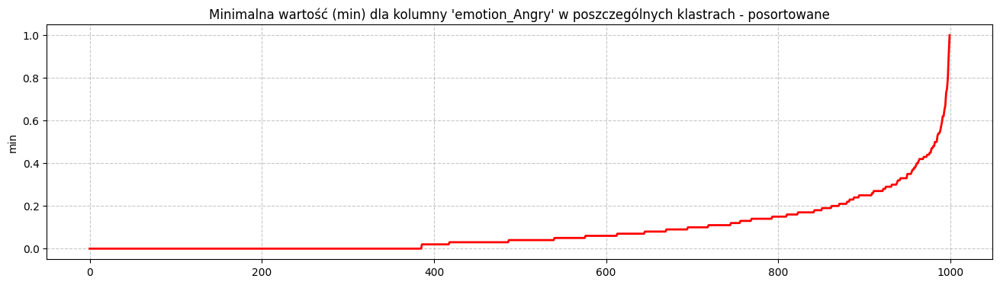

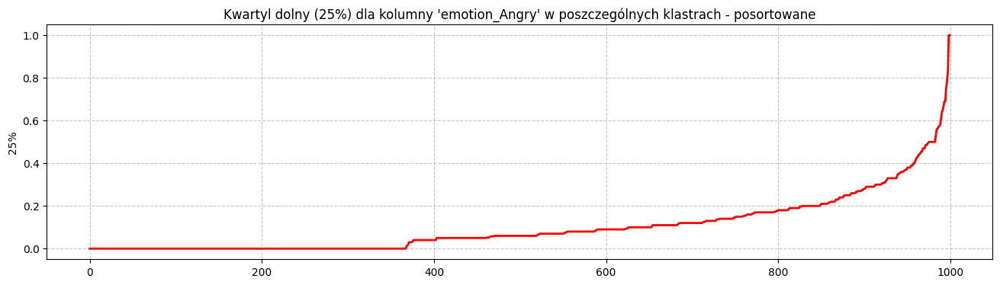

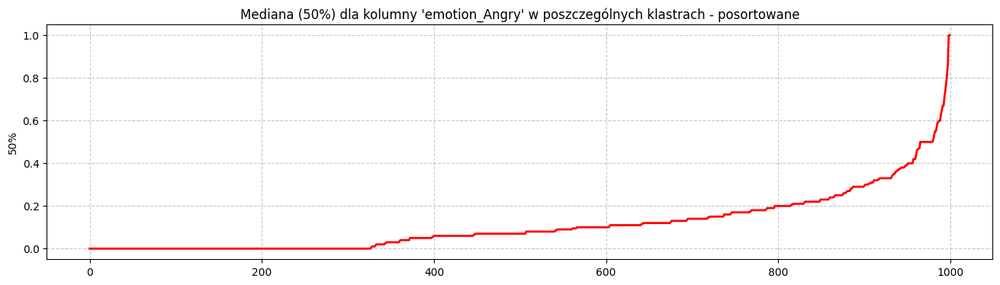

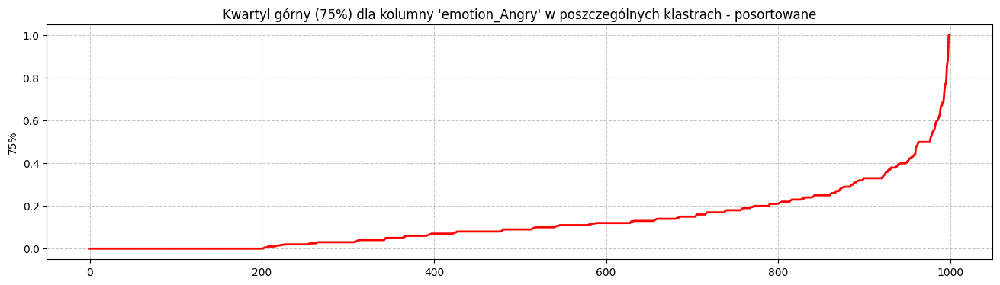

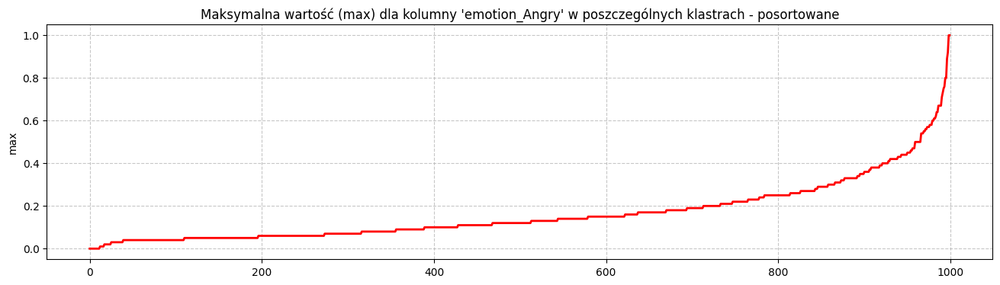

In [135]:
plot_stat_sorted(df_stats_compound, 'compound', 'c')
plot_stat_sorted(df_stats_happy, 'emotion_Happy', 'y')
plot_stat_sorted(df_stats_surprise, 'emotion_Surprise', 'g')
plot_stat_sorted(df_stats_sad, 'emotion_Sad', 'b')
plot_stat_sorted(df_stats_fear, 'emotion_Fear', 'm')
plot_stat_sorted(df_stats_angry, 'emotion_Angry', 'r')

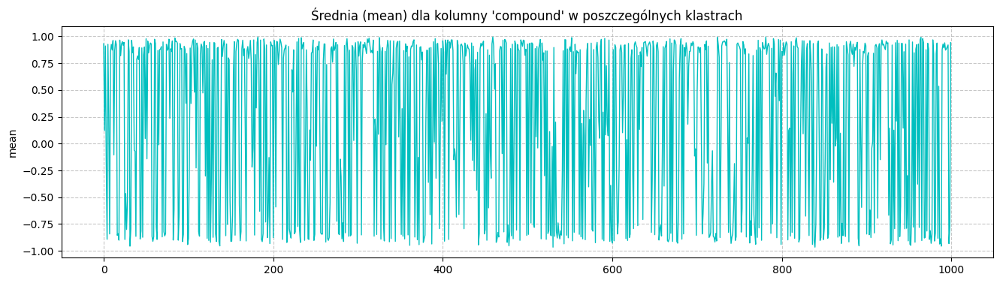

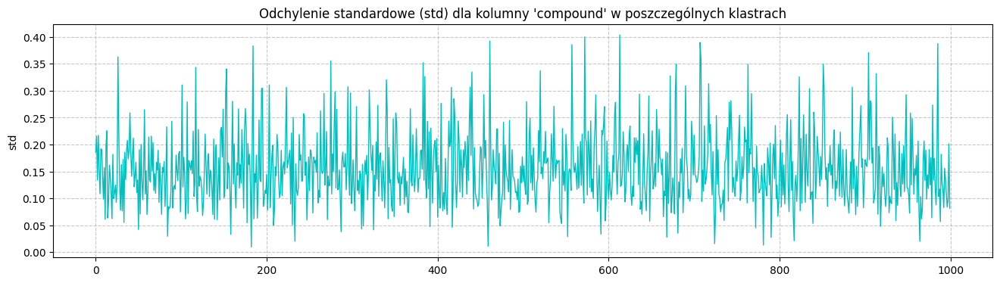

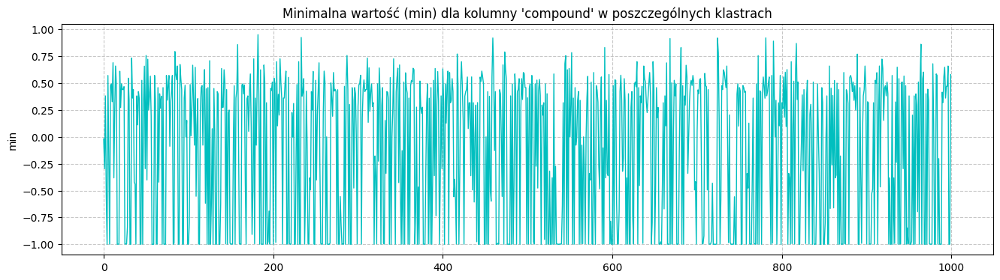

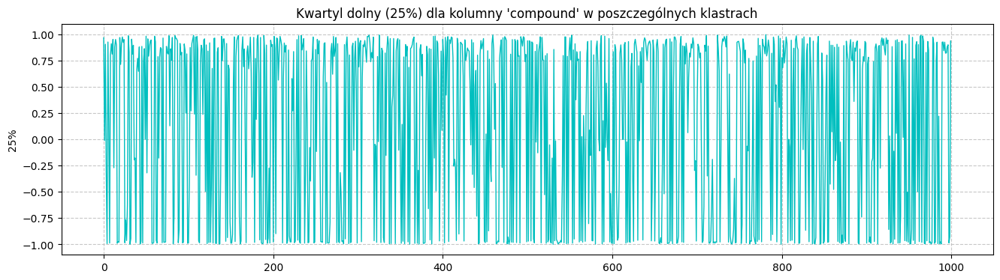

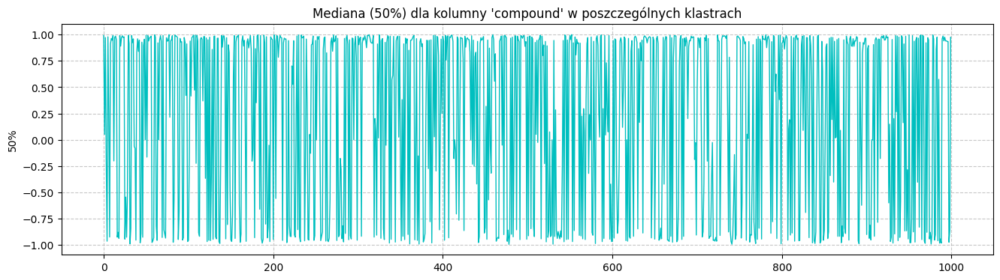

...

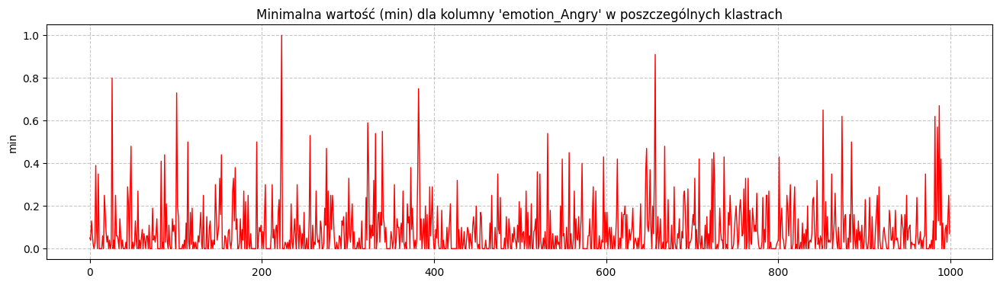

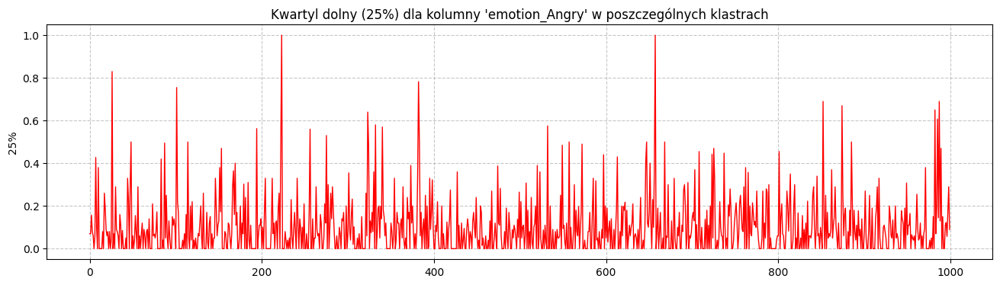

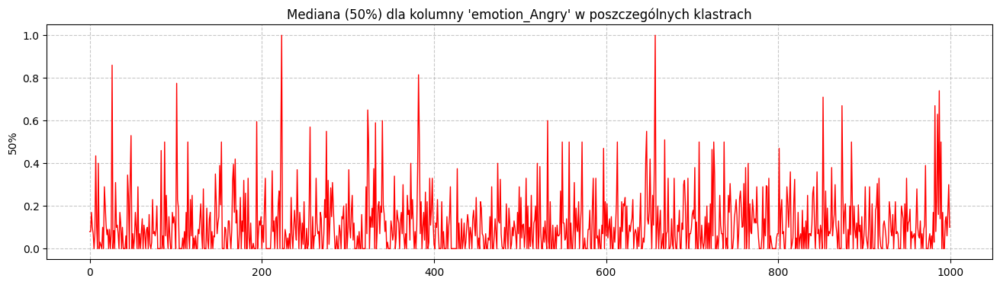

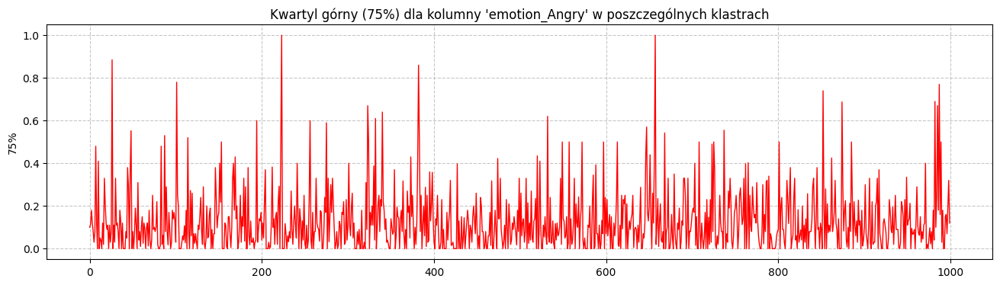

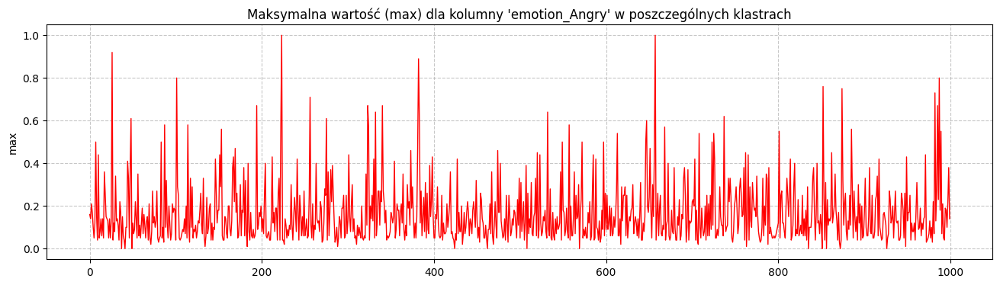

In [136]:
plot_stat(df_stats_compound, 'compound', 'c')
plot_stat(df_stats_happy, 'emotion_Happy', 'y')
plot_stat(df_stats_surprise, 'emotion_Surprise', 'g')
plot_stat(df_stats_sad, 'emotion_Sad', 'b')
plot_stat(df_stats_fear, 'emotion_Fear', 'm')
plot_stat(df_stats_angry, 'emotion_Angry', 'r')

In [177]:
# df_song_data.sort_values(['emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise'])
# df_cluster_id[df_cluster_id['emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise'] == 0]
df_zero_val = df_cluster_id.loc[(df_cluster_id['emotion_Happy'] == 0) & (df_cluster_id['emotion_Fear'] == 0) & (df_cluster_id['emotion_Sad'] == 0)& (df_cluster_id['emotion_Angry'] == 0)& (df_cluster_id['emotion_Surprise'] == 0)]

df_zero_val[['emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise']]

,emotion_Happy,emotion_Fear,emotion_Sad,emotion_Angry,emotion_Surprise
332,0.0,0.0,0.0,0.0,0.0
1394,0.0,0.0,0.0,0.0,0.0
2167,0.0,0.0,0.0,0.0,0.0
3688,0.0,0.0,0.0,0.0,0.0
5396,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...
47115,0.0,0.0,0.0,0.0,0.0
47260,0.0,0.0,0.0,0.0,0.0
47482,0.0,0.0,0.0,0.0,0.0
48184,0.0,0.0,0.0,0.0,0.0


In [182]:
df_cluster_470 = df_song_data.loc[(df_song_data['cluster'] == 470)]
df_cluster_470[['cluster', 'title','artist','decade', 'compound', 'emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise','lyrcis_preprocessed']]

,cluster,title,artist,decade,compound,emotion_Happy,emotion_Fear,emotion_Sad,emotion_Angry,emotion_Surprise,lyrcis_preprocessed
3243,470,Remorse for Intemperate Speech,William Butler Yeats,1930s,-0.2672,0.30,0.20,0.30,0.10,0.10,ranted knave fool outgrew school would transfo...
6146,470,I Cant Stop Loving You,Kitty Wells,1950s,-0.0505,0.35,0.18,0.29,0.06,0.12,can't stop loving i've made mind live memory o...
6635,470,I Can’t Stop Lovin’ You,Don Gibson,1950s,-0.0505,0.35,0.18,0.29,0.06,0.12,can't stop loving i've made mind live memory o...
10074,470,I Cant Stop Loving You,George Jones & Gene Pitney,1960s,-0.5371,0.39,0.13,0.30,0.04,0.13,can't stop loving i've made mind live memory o...
11909,470,I Cant Stop Loving You,Hank Locklin,1960s,-0.0505,0.35,0.18,0.29,0.06,0.12,can't stop loving i've made mind live memory o...
12746,470,That’s When I’ll Stop Loving You,Linda Jones (with The O'Jays),1960s,0.1531,0.35,0.15,0.35,0.05,0.10,that's i'll stop loving that's i'll stop lovin...
14284,470,It Aint Me Babe,Ola & the janglers,1960s,0.0010,0.31,0.23,0.31,0.08,0.08,go away window going chosen speed i'm one want...
14389,470,No Mules Fool,Family (UK rock band),1960s,0.2023,0.40,0.09,0.34,0.09,0.09,dusty day old town hazy yellow eye look buzzin...
16745,470,Us,Shel Silverstein,1970s,-0.0417,0.33,0.22,0.33,0.00,0.11,we're always together see wish he'd leave i'd ...
21193,470,The Attitude,Andrew Dice Clay,1980s,-0.3251,0.41,0.22,0.25,0.06,0.06,nobody tell even suppose nice people fuck nice...


In [196]:
pd.set_option('display.max_colwidth', 600) 
print(df_cluster_470.shape)
df_cluster_470[['cluster','title','artist','lyrcis_preprocessed']]


(21, 18)


,cluster,title,artist,lyrcis_preprocessed
3243,470,Remorse for Intemperate Speech,William Butler Yeats,ranted knave fool outgrew school would transform part fit audience found cannot rule fanatic heart sought better though fine manner liberal speech turn hatred sport nothing said done reach fanatic heart ireland come great hatred little room maimed u start carry mother's womb fanatic heart
6146,470,I Cant Stop Loving You,Kitty Wells,can't stop loving i've made mind live memory old lonesome time can't stop wanting useless say i'll live life dream yesterday happy hour knew though long ago still make blue say time heel broken heart time stood still since we've apart can't stop loving
6635,470,I Can’t Stop Lovin’ You,Don Gibson,can't stop loving i've made mind live memory old lonesome time can't stop wanting useless say i'll live life dream yesterday happy hour knew though long ago still make blue say time heel broken heart time stood still since we've apart can't stop loving
10074,470,I Cant Stop Loving You,George Jones & Gene Pitney,can't stop loving i've made mind live memory old lonesome time can't stop wanting useless say i'll live life dream yesterday happy hour knew though long ago still make blue say time heel broken heart time stood still since we've apart can't stop loving use try pretend someone new can't live lie can't stop wanting way one one can't stop loving i've made mind live memory old lonesome time
11909,470,I Cant Stop Loving You,Hank Locklin,can't stop loving i've made mind live memory old lonesome time can't stop wanting useless say i'll live life dream yesterday happy hour knew though long ago still make blue say time heel broken heart time stood still since we've apart can't stop loving
12746,470,That’s When I’ll Stop Loving You,Linda Jones (with The O'Jays),that's i'll stop loving that's i'll stop loving bird longer use wing fly raindrop stop falling sky mathmeticians find one plus one two doncha know that's doncha know that's i'll stop lovin' baby stop lovin' ya darlin' remedy ache an' ache pain flower flower longer longer grow rain old broadway broadway change fifth avenue doncha know that's oooh that's i'll stop lovin' aw baby way i'll stop lovin' ya darlin' shown joy love truly bring yes ya made sad life like first day like first day woooooooooooh first day spring oo oo oo ray sun gone longer longer give u heat ol' heart mine know one day...
14284,470,It Aint Me Babe,Ola & the janglers,go away window going chosen speed i'm one want babe i'm one need say lookin' someone never weak always strong protect defend whether right wrong someone open every door ain't babe ain't babe ain't lookin' babe go lightly ledge babe go lightly ground i'm one want babe let say lookin' someon promise never part somone who'll close eye someone close heart someone who'll die ain't babe ain't babe ain't lookin' babe go melt back night babe everything inside made stone nothing moving anyway i'm alone say looking someone pick time fall gather flower constantly come time call lover life nothing ain...
14389,470,No Mules Fool,Family (UK rock band),dusty day old town hazy yellow eye look buzzing bee's lazy sound take grass hit hay two u drift day butterfly sigh flick away know we're lazy lot people say one day they're gonna see we're whatever make u happy we're sitting mule make rule cool know i'm lazy lot people say one day they're gonna see we're whatever make u happy we're sitting mule we're nobody's fool cool close eye feel alright must close got shade good old hat made hide one day god's good sun move anyone spend lazy day way turning i'm looking old mule stubborn nag one's fool he's friend he's cool old mule nobody's fool
16745,470,Us,Shel Silverstein,we're always together see wish he'd leave i'd free i'm getting little bit tired may bit bored movie lady cannot agree like dance love ski like mountain love sea like hot chocolate want tea want sleep pee he's meaner duller fatter guess worse thing could instead two could three
2

In [200]:
pd.set_option('display.max_colwidth', 50) 
df_cluster_327 = df_song_data.loc[(df_song_data['cluster'] == 327)]
df_cluster_327[['cluster', 'title','artist','decade', 'compound', 'emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise','lyrcis_preprocessed']].sort_values('artist')

,cluster,title,artist,decade,compound,emotion_Happy,emotion_Fear,emotion_Sad,emotion_Angry,emotion_Surprise,lyrcis_preprocessed
35417,327,Screwed on Tight,Abstract Rude,2000s,-0.9453,0.06,0.48,0.15,0.09,0.21,gonna like concentration use brain keep rhythm...
16233,327,August,Adrienne Rich,1970s,-0.6939,0.07,0.53,0.13,0.07,0.20,two horse stand yellow light eating windfall a...
41818,327,Drill Time Freestyle,Bankroll Marky,2010s,-0.8834,0.05,0.48,0.14,0.10,0.24,rollie guess who's back aye hea ain't say long...
16973,327,Dangerous Stranger,Be Bop Deluxe,1970s,-0.9719,0.00,0.57,0.10,0.14,0.19,nelson midnight city broken dream alley galile...
21903,327,Introduction to Poetry by Collins,Billy Collins,1980s,-0.7096,0.00,0.50,0.12,0.12,0.25,ask take poem hold light like color slide pres...
21311,327,Introduction to Poetry,Billy Collins,1980s,-0.7096,0.00,0.50,0.12,0.12,0.25,ask take poem hold light like color slide pres...
49878,327,The Abortion Song,Birds of Accord,2020s,-0.9963,0.00,0.57,0.11,0.09,0.24,intro abortion portion make another portion li...
49217,327,The Swords of the Headless Angels,Borgne,2020s,-0.9828,0.00,0.57,0.17,0.09,0.17,one look sky may miss danger front dreamer whi...
49328,327,The Wars of Gods and Men,Brutalody,2020s,-0.9908,0.03,0.54,0.14,0.11,0.17,insidious artifice source violent intrigue cal...
310,327,Voice Throwin Blues,Buddy Boy Hawkins,1920s,-0.9774,0.00,0.56,0.18,0.05,0.21,come dawn stay late call hesitate tell long wa...


In [201]:
pd.set_option('display.max_colwidth', 600) 
print(df_cluster_327.shape)
df_cluster_327[['cluster','title','artist','lyrcis_preprocessed']]

(55, 18)


,cluster,title,artist,lyrcis_preprocessed
310,327,Voice Throwin Blues,Buddy Boy Hawkins,come dawn stay late call hesitate tell long wait get honey must hesitate ain't miller miller's son miller miller come tell long wait get honey must hesitate might sing verse tune maybe nothing later tell long wait get honey must hesitate high yellow evil brown evil reason fair brown need tell long wait get honey must hesitate come dawn stay late call hesitate tell long wait get honey must hesitate mama told daddy told woman round gonna death tell long wait get honey must hesitate ain't doctor doctor's son ease pain till doctor come tell long wait get honey must hesitate want sugar tea woma...
1021,327,The Hollow Men 1925,T.S. Eliot,mistah kurtzhe dead penny old guy hollow men stuffed men leaning together headpiece filled straw ala dried voice whisper together quiet meaningless wind dry grass rats' foot broken glass dry cellar shape without form shade without colour paralysed force gesture without motion crossed direct eye death's kingdom remember usif allnot lost violent soul hollow men stuffed men ii eye dare meet dream death's dream kingdom appear eye sunlight broken column tree swinging voice wind's singing distant solemn fading star let nearer death's dream kingdom let also wear deliberate disguise rat's coat cro...
2579,327,Tom Dooley,Grayson & Whitter,hang head tom dooley hang head cry killed poor laura foster know bound die took hillside god almighty know took hillside hid clothes took roadside begged excused took roadside hid shoe took hillside make wife took hillside took life hang head tom dooley hang head cry killed poor laura foster know bound die take old violin play please time tomorrow it'll use hang head tom dooley hang head cry killed poor laura foster know bound die dug grave four foot long dug three foot deep rolled old cold clay o'er tromped foot hang head tom dooley hang head cry killed poor laura foster know bound die wo...
2701,327,John the Baptist,Moses Mason,john done saw number way middle air john done saw number way middle air inculcating john baptist preaching wilderness child came east came east kingdom heaven ain't spoken prophecy voice one cry wilderness badly stayed away day lord made sadly stayed insane john raiment camel hide leather girdle john done saw number way middle air john done saw number way middle air cry holy holy holy lord god holy jesus came nazarene unto galilee baptized john jordan john said unto come talk need baptized thee jesus said unto john suffer thus becomes u fill righteousness john done saw number way middle ai...
4574,327,Laura - Opening Scene,"Jay Dratler, Samuel Hoffenstein and Elizabeth Reinhardt",shall never forget weekend laura died silver sun burned sky like huge magnifying glass hottest sunday recollection felt human left new york laura's horrible death alone waldo lydecker one really knew begun write laura's story another detective came see wait could watch half open door noted attention fixed upon clock one existence laura's apartment room murdered
7120,327,On the Decline of Oracles,Sylvia Plath,father kept vaulted conch two bronze bookend ship sail listened cold teeth seethed voice ambiguous sea old bcklin missed held shell hear sea could hear seashell spoke inner ear knew peasant know father died died willed book shell away book burned sea took shell kept voice set ear eye sight blue unseen wave ghost bcklin grief peasant feast multiply never need see temple broken stone worn curtain rear white head god madman nobody know dare ask tomorrow's gossip doldrums much vision good like persistant stitch side nag tedious
7308,327,TC Treasure — Time Travel Treasure Hunt – November 2020 - Clue 12,Johannes (US),grand finale head valley catching one thirty one strap ski glide easequickly run find ranch broken branch look beneath leaf steal tower harness powera pair thick thief location scouted journey routed head final goal make score hurry thing spiral control gain possession flux c

In [203]:
pd.set_option('display.max_colwidth', 50) 
df_cluster_925 = df_song_data.loc[(df_song_data['cluster'] == 925)]
df_cluster_925[['cluster', 'title','artist','decade', 'compound', 'emotion_Happy', 'emotion_Fear','emotion_Sad','emotion_Angry','emotion_Surprise','lyrcis_preprocessed']].sort_values('artist')

,cluster,title,artist,decade,compound,emotion_Happy,emotion_Fear,emotion_Sad,emotion_Angry,emotion_Surprise,lyrcis_preprocessed
29481,925,In A Magazine,911,1990s,0.9939,0.18,0.24,0.20,0.07,0.31,girl lookin good like lady remember saw saw ma...
38743,925,Deer Blind,Aaron Watson,2010s,0.9740,0.17,0.23,0.23,0.08,0.29,kevin fowler john anderson finally today day p...
42727,925,For Me,Adri Ray,2010s,0.9821,0.17,0.25,0.23,0.05,0.30,verse summer day way felt even need say always...
24875,925,It Isnt It Wasnt It Aint Never Gonna Be,Aretha Franklin,1980s,0.9731,0.19,0.19,0.23,0.10,0.29,ain't never gonna ain't never gonna hangin' 'r...
42213,925,Love yourself,BabyDoll28,2010s,0.9437,0.19,0.19,0.22,0.11,0.30,mind youre ugly anyone stand look think lookin...
...,...,...,...,...,...,...,...,...,...,...,...
17334,925,Roll With It,Trooper (CAN),1970s,0.8045,0.20,0.20,0.20,0.10,0.30,know i'm fooling i'm fooling thing drive crazy...
23570,925,Where Did You Go?,UTFO,1980s,0.9607,0.19,0.18,0.26,0.08,0.29,we're stay clap hand way 'cause we're gonna ro...
16498,925,The Rock WWE Profile,WWE,1970s,0.9702,0.20,0.20,0.20,0.10,0.30,height weight lb debut hometown miami florida ...
27839,925,The Excorcist III - Was I Raving?,William Peter Blatty,1990s,0.9566,0.24,0.20,0.20,0.08,0.28,well awfully dead electric chair like would up...


In [204]:
pd.set_option('display.max_colwidth', 600) 
print(df_cluster_925.shape)
df_cluster_925[['cluster','title','artist','lyrcis_preprocessed']]

(78, 18)


,cluster,title,artist,lyrcis_preprocessed
57,925,Treasures Untold,Jimmie Rodgers,dreaming eye blue i've loved forever seems longed dear wanted near girl dream although met i'd tell love somehow could win heart little girl would treasure untold kiss gave life's sweetest dream even precious gold love sweet face dear smiling eye often story's told could win heart little girl would treasure untold
1792,925,I Dont Know And I Dont Care Blues,Trixie Smith,sadie snow carefree gal heart like piece lead man used love said packed grip went away blood eye friend asked sally went coldly replied know care lovin' daddy's gone gone long ago i'd like know he's waiting sweet mama sally's like cold march wind change every found really pay end make little change men know care way daddy's gone love man he'll treat like dog he'll hop around like frog know care lovin' daddy's gone ain't seen man can't stand lose 'cause keep know care blue lord know care lovin' daddy's gone
2996,925,Gadsby Chapter 11,Ernest Vincent Wright,go back nancy august frank stumblingly told gadsby troth along april branton hill told grand church ritual would occur may may blossom bird balmy air idyllic month matrimony wish could call grand church affair common customary nomination word cant possibly crowd story must pas simply church ritual right far good along april branton hill agog awaiting information actual day say night gadsbys old organization youth still loyal way back day formation day almost constantly running around town soliciting fund many good municipal activity finally group got card announcing may fourth branton hill...
3439,925,Any Old Iron,Harry Champion,couple o' week ago poor old uncle bill went kicked bucket left night tottered 'round see auntie jane auntie said uncle left watch chain put right across vest thought looked dandy dangled chest flash started walkin' 'round kid runnin' began shout old iron old iron old iron look neat talk treat look dapper napper foot dressed style wi' brand new tile father's old green tie give tuppence old watch chain old iron old iron forget got married selena brown way people laughed made feel clown began wonder dial began crack mistake i'd got sunday trouser front back put chain derby kell sun shining ma...
4051,925,Shave Em Dry,Lucille Bogan,got nipple titty big end thumb got somethin' legs'll make dead man come daddy baby shave 'em dry draw want grind baby grind cry say fucked night night baby feel like wanna fuck great god daddy grind honey shave dry hear holler baby want shave dry got nipple titty big end thumb daddy say that's kind 'em want make 'em come daddy shave dry i'll give somethin' baby swear it'll make cry i'm gon' turn back mattress let oil spring want grind daddy 'til bell ring daddy want shave 'em dry great god daddy can't shave 'em baby try fuckin' thing would take heaven i'd fuckin' studio till clock strike e...
...,...,...,...,...
44879,925,Well Get By The Autism Song,Johnny Orr Band,maybe speak well i'm coming outta shell like playing can't tell like go school i'm miracle i'm glad alive wait patiently well eventually understand word saying autism like prison i'm share heart mind share pain scream night can't express i'm going way cry mom see fear every single tear know i've caused pain inside autism like prison i'm shar joy mind show love time caus reality take everything make without fight know love hug hear pray god heal maybe one day pray see cry reprise maybe one day way we'll get
46340,925,Glory,Lilgrinch,moon star telling story story story look eye tell worry worry worry say one day reach glory glory say one day reach glory glory remember said gonna ride remember said theyll remember said wouldnt leave yet im alon see remember thy said would help yet im care self play mental health drowning sorrow see tomorrow friend got blade im tempted borrow cannot cut cause many follow follow word follow action look mirror dont like reflection hate net attention hard love cant find affection stick music got m